<a href="https://colab.research.google.com/github/krishnaduttPanchagnula/Python_projects/blob/main/Crop_detection%20using%20computer%20Vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install geopandas
!pip install rasterio
!pip install -U scikit-image
!pip install Pillow

     |████████████████████████████████| 29.2 MB 49 kB/s 
  Attempting uninstall: scikit-image
    Found existing installation: scikit-image 0.16.2
    Uninstalling scikit-image-0.16.2:
      Successfully uninstalled scikit-image-0.16.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
albumentations 0.1.12 requires imgaug<0.2.7,>=0.2.5, but you have imgaug 0.2.9 which is incompatible.


In [ ]:
import numpy as np
import geopandas as gpd
import matplotlib.pyplot as plt
%matplotlib inline 

import rasterio as rt
from rasterio.plot import show
from skimage.feature import match_template
from PIL import Image


In [ ]:
base = rt.open('/content/drive/MyDrive/github projects data/Crop detection data/Rst/palmaOrthoTotal_14cm.tif')
print (base.crs)
print(str(base.count))
print( str(base.colorinterp))

EPSG:4326
4
(<ColorInterp.red: 3>, <ColorInterp.green: 4>, <ColorInterp.blue: 5>, <ColorInterp.alpha: 6>)


In [ ]:
shp = gpd.read_file('/content/drive/MyDrive/github projects data/Crop detection data/Shp/pointData.shp')
print(shp.crs)


epsg:4326


/usr/local/lib/python3.7/dist-packages/rasterio/plot.py:107: NodataShadowWarning: The dataset's nodata attribute is shadowing the alpha band. All masks will be determined by the nodata attribute
  arr = source.read(rgb_indexes, masked=True)


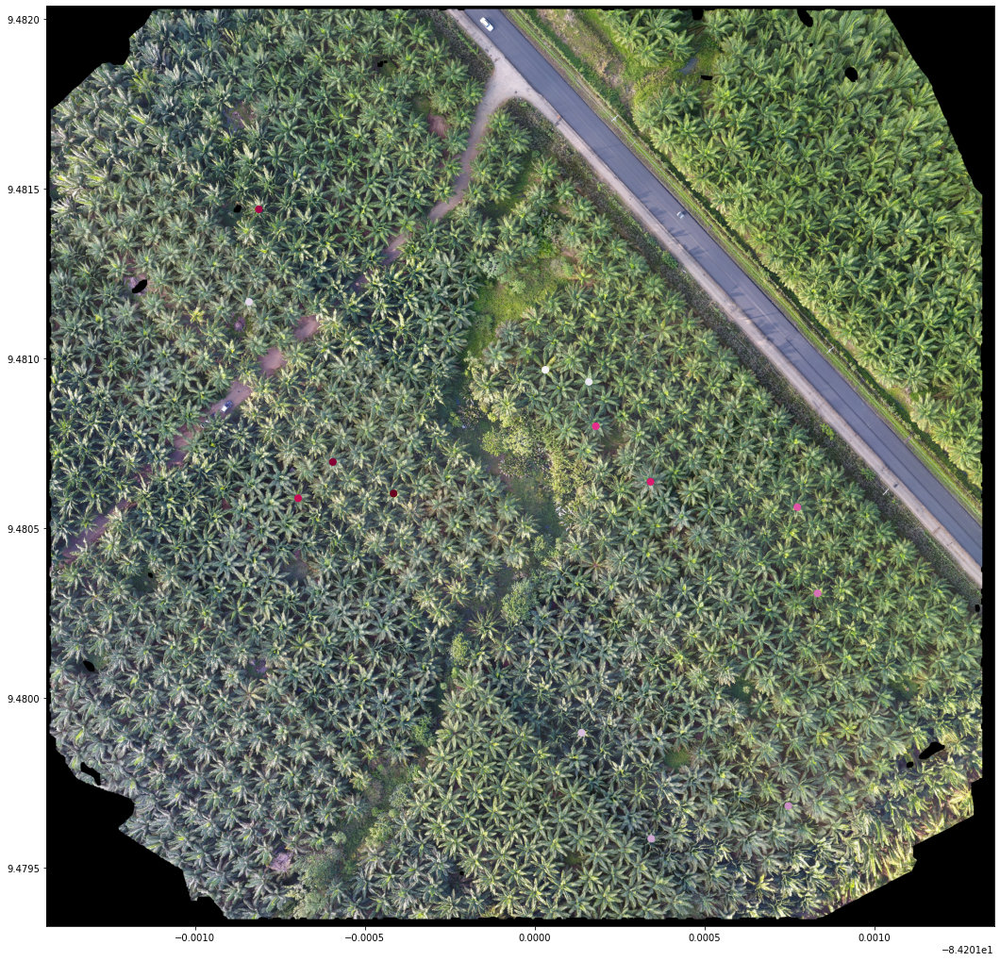

In [ ]:
fig, ax = plt.subplots(figsize=(18,18))
shp.plot(ax=ax,cmap ='PuRd',markersize  = 50)
show(base,ax=ax)

In [ ]:
red = base.read(2)
#for i in range(1,4):
#  bands_i = base.read(i)

In [ ]:
surveyRowCol = []
for index, values in shp.iterrows():
    x = values['geometry'].xy[0][0]
    y = values['geometry'].xy[1][0]
    row, col = base.index(x,y)
    print("Point N°:%d corresponds to row, col: %d, %d"%(index,row,col))
    surveyRowCol.append([row,col])

Point N°:0 corresponds to row, col: 848, 1162
Point N°:1 corresponds to row, col: 875, 1263
Point N°:2 corresponds to row, col: 689, 471
Point N°:3 corresponds to row, col: 1693, 1246
Point N°:4 corresponds to row, col: 1940, 1408
Point N°:5 corresponds to row, col: 1864, 1727
Point N°:6 corresponds to row, col: 1368, 1796
Point N°:7 corresponds to row, col: 1168, 1748
Point N°:8 corresponds to row, col: 979, 1279
Point N°:9 corresponds to row, col: 1108, 1407
Point N°:10 corresponds to row, col: 1147, 586
Point N°:11 corresponds to row, col: 473, 494
Point N°:12 corresponds to row, col: 1062, 667
Point N°:13 corresponds to row, col: 1136, 808


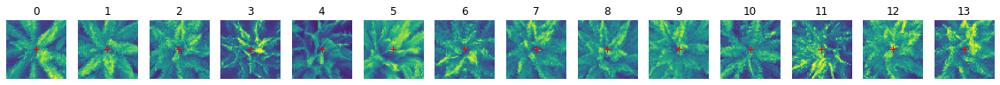

In [ ]:
# Search radius of our image
radius = 25

fig, ax = plt.subplots(1, len(surveyRowCol),figsize=(20,5))

for index, item in enumerate(surveyRowCol):
    row = item[0]
    col = item[1]
    ax[index].imshow(red)
    ax[index].plot(col,row,color='red', linestyle='dashed', marker='+',
     markerfacecolor='blue', markersize=8)
    ax[index].set_xlim(col-radius,col+radius)
    ax[index].set_ylim(row-radius,row+radius)
    ax[index].axis('off')
    ax[index].set_title(index)

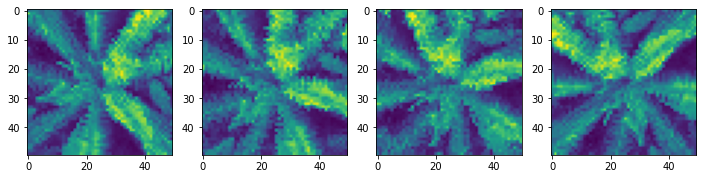

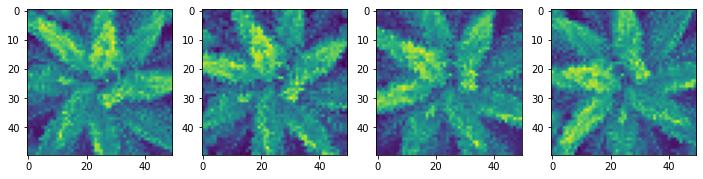

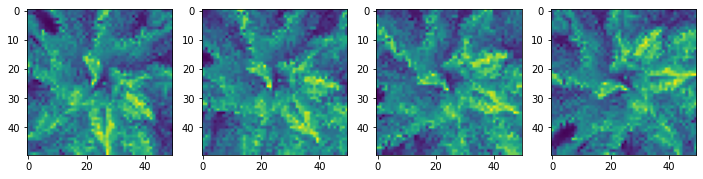

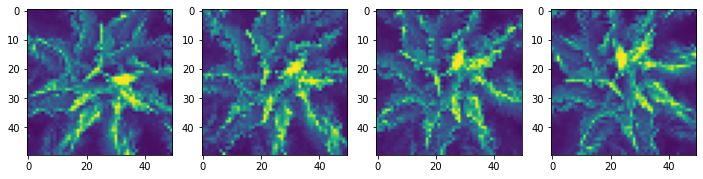

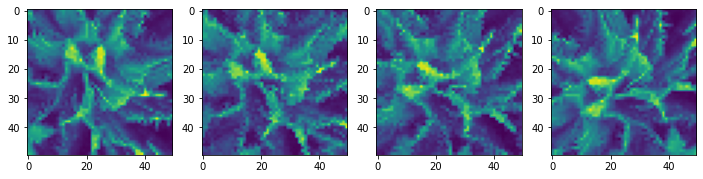

...

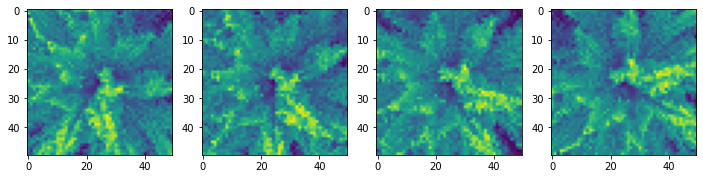

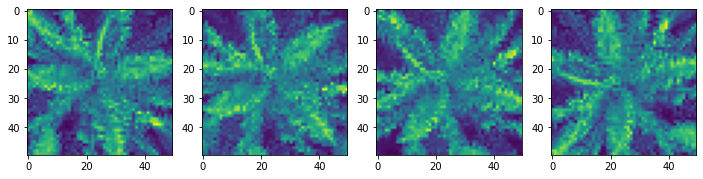

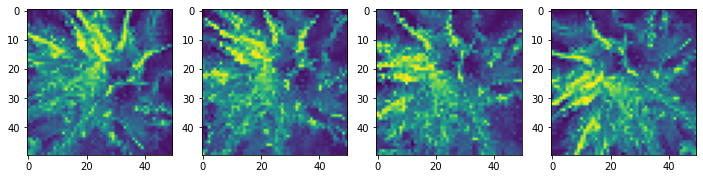

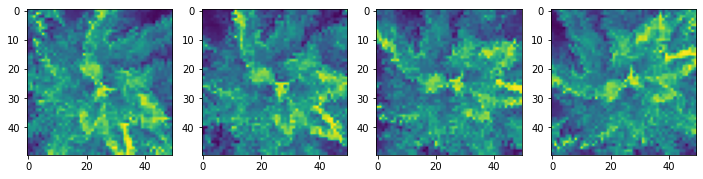

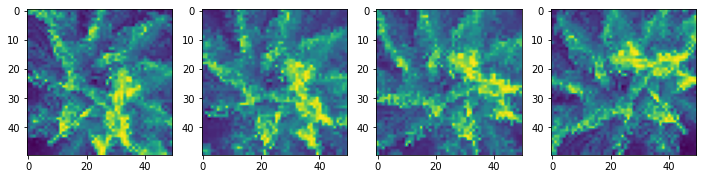

In [ ]:
result = []

Bandlist = []
for rowCol in surveyRowCol:
    imageList = []
    row = rowCol[0]
    col = rowCol[1]
    
    #append original band
    imageList.append(red[row-radius:row+radius, col-radius:col+radius])
    
    #append rotated images
    rotate = red[row-2*radius:row+2*radius, col-2*radius:col+2*radius]
    rotationList = [i*30 for i in range(1,4)]
    for rotation in rotationList:
        rotatedRaw = Image.fromarray(rotate)
        rotatedImage = rotatedRaw.rotate(rotation)
        imageList.append(np.asarray(rotatedImage)[radius:-radius,radius:-radius])
    
    #plot original and rotated images
    fig, ax = plt.subplots(1, len(imageList),figsize=(12,12))
    for index, item in enumerate(imageList):
        ax[index].imshow(imageList[index])
    #add images to total list
    Bandlist+=imageList

In [ ]:
matchList = []
for index, templateband in enumerate(Bandlist):
    if index%10 == 0:
        print('Match template ongoing for figure Nº %d'%index)
    matchTemplate = match_template(red, templateband, pad_input=True)
    matchTemplateFiltered = np.where(matchTemplate>np.quantile(matchTemplate,0.999))
    for item in zip(matchTemplateFiltered[0],matchTemplateFiltered[1]):
        x, y = base.xy(item[0], item[1])
        matchList.append([x,y])

Match template ongoing for figure Nº 0
Match template ongoing for figure Nº 10
Match template ongoing for figure Nº 20
Match template ongoing for figure Nº 30
Match template ongoing for figure Nº 40
Match template ongoing for figure Nº 50


/usr/local/lib/python3.7/dist-packages/rasterio/plot.py:107: NodataShadowWarning: The dataset's nodata attribute is shadowing the alpha band. All masks will be determined by the nodata attribute
  arr = source.read(rgb_indexes, masked=True)


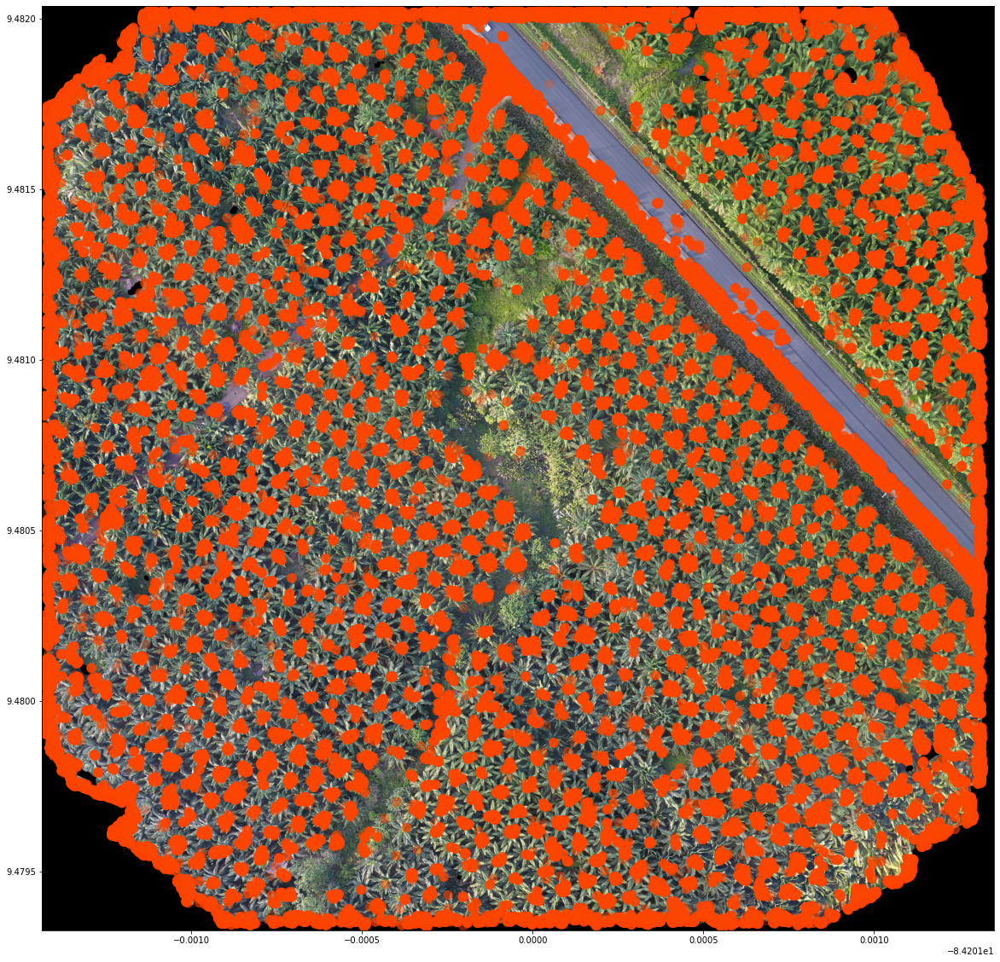

In [ ]:
# plot interpreted points over the image
fig, ax = plt.subplots(figsize=(20, 20))
matchArray = np.array(matchList)
ax.scatter(matchArray[:,0],matchArray[:,1], marker='o',c='orangered', s=100, alpha=0.25)
show(base, ax=ax)

In [ ]:
from sklearn.cluster import Birch
brc = Birch(branching_factor=10000, n_clusters=None, threshold=2e-5, compute_labels=True)
brc.fit(matchArray)
birchPoint = brc.subcluster_centers_
birchPoint





array([[-84.20037284,   9.48200926],
       [-84.2000994 ,   9.48200683],
       [-84.20064878,   9.48197669],
       ...,
       [-84.20040122,   9.48042107],
       [-84.20115347,   9.47998221],
       [-84.20234733,   9.47975931]])

/usr/local/lib/python3.7/dist-packages/rasterio/plot.py:107: NodataShadowWarning: The dataset's nodata attribute is shadowing the alpha band. All masks will be determined by the nodata attribute
  arr = source.read(rgb_indexes, masked=True)


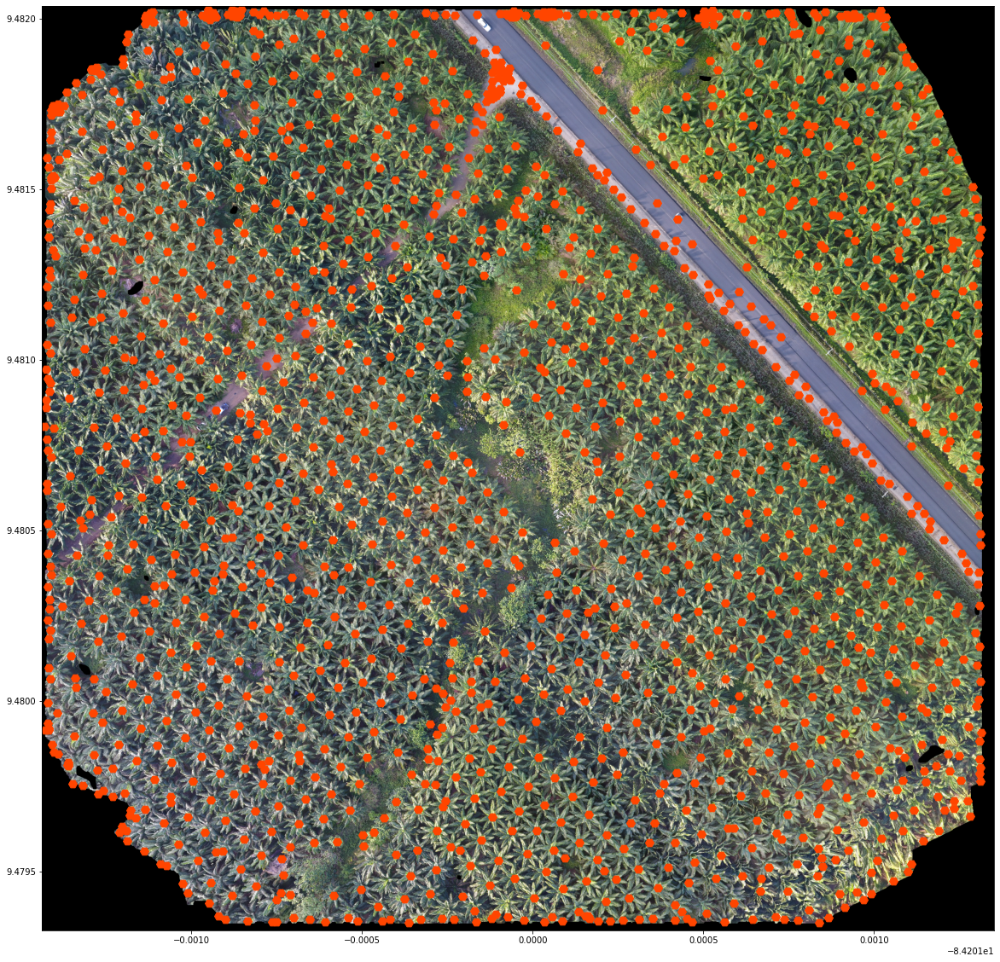

In [ ]:
# plot clustered points
fig = plt.figure(figsize=(20, 20))
ax = fig.add_subplot(111)
ax.scatter(birchPoint[:,[0]],birchPoint[:,[1]], marker='H',color='orangered',s=100)
show(base, ax=ax)
